# Cosmic Large Pair Comparison

This notebook compares two reference-image preparation paths on the local `cosmic_large` sample subset:

- **Current approach**: the logic currently used by `start_ba_comet_large_256_new.sh`
- **Shared approach**: the `get_ref_images()` / `get_bigger_crop()` logic you shared

Notes:
- The notebook uses `gathered_data_cosmic_large_filtered_sample_two.json`, which was filtered from the full JSON to only records whose `face_paths` exist under the local sample tree.
- To keep the visual comparison readable, the notebook disables random horizontal flips by default.
- The same randomly chosen **target** image is used for both approaches. The comparison changes the **reference selection/crop** logic only.

In [7]:
from __future__ import annotations

import json
import math
import re
import textwrap
from copy import deepcopy
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display
from matplotlib.patches import Rectangle
from PIL import Image

plt.style.use("seaborn-v0_8-whitegrid")

RNG_SEED = 42
PAIR_SAMPLE_SIZE = 20
PAIRS_PER_ROW = 4
CROP_SCALE = 0.2
APPLY_RANDOM_FLIP = False

FACE_DATASET_DIR = Path('/home/kolyangg/rsrch/dataset_full/cosmic_large/LAION-5B-Filtered-Large-Faces/laion1B-nolang')
METADATA_JSON = Path('/home/kolyangg/rsrch/dataset_full/cosmic_large/gathered_data_cosmic_large_filtered_sample_two.json')
FACE_PATH_PREFIX = 'LAION-5B-Filtered-Large-Faces/laion1B-nolang'

with METADATA_JSON.open() as f:
    METADATA = json.load(f)

print({
    'metadata_records': len(METADATA),
    'face_dataset_dir': str(FACE_DATASET_DIR),
    'metadata_json': str(METADATA_JSON),
})

{'metadata_records': 15, 'face_dataset_dir': '/home/kolyangg/rsrch/dataset_full/cosmic_large/LAION-5B-Filtered-Large-Faces/laion1B-nolang', 'metadata_json': '/home/kolyangg/rsrch/dataset_full/cosmic_large/gathered_data_cosmic_large_filtered_sample_two.json'}


In [8]:
def relative_face_path(face_path: str) -> str:
    face_path = str(face_path).lstrip('/')
    prefix = FACE_PATH_PREFIX.rstrip('/') + '/'
    if face_path.startswith(prefix):
        return face_path[len(prefix):]
    marker = f"/{FACE_DATASET_DIR.name}/"
    marked = f"/{face_path}"
    if marker in marked:
        return marked.split(marker, 1)[1]
    return face_path


def face_abs_path(face_path: str) -> Path:
    return FACE_DATASET_DIR / relative_face_path(face_path)


def clip_bbox_to_image(bbox, img_size):
    if bbox is None:
        return None
    img_w, img_h = img_size
    x0, y0, x1, y1 = [float(v) for v in bbox]
    clipped = [
        max(0.0, min(float(img_w), x0)),
        max(0.0, min(float(img_h), y0)),
        max(0.0, min(float(img_w), x1)),
        max(0.0, min(float(img_h), y1)),
    ]
    if clipped[2] <= clipped[0] or clipped[3] <= clipped[1]:
        return None
    return clipped


def get_face_bbox(record: dict, face_path: str):
    bbox_map = record.get('face_bboxes') or {}
    bbox = bbox_map.get(face_path)
    if bbox is None:
        return None
    return clip_bbox_to_image([float(v) for v in bbox], (256, 256))


def load_face_image(face_path: str) -> Image.Image:
    path = face_abs_path(face_path)
    if not path.is_file():
        raise FileNotFoundError(path)
    return Image.open(path).convert('RGB')


def basename_label(path: str) -> str:
    p = Path(str(path))
    return f"{p.parent.name}/{p.name}"


PROMPT_CLASS_RE = re.compile(r"\b(woman|man|girl|boy|child|person)\b", re.IGNORECASE)


def infer_prompt_class(record: dict) -> str:
    facial_caption = record.get('facial_caption', '')
    if isinstance(facial_caption, str) and facial_caption.strip():
        match = PROMPT_CLASS_RE.search(facial_caption)
        if match is not None:
            return match.group(1).lower()
    return 'person'


def build_prompt(record: dict) -> str:
    text = record.get('text', '')
    if isinstance(text, str) and text.strip():
        return text.strip()
    return f"A {infer_prompt_class(record)} img"

In [9]:
def current_get_bigger_crop_with_bbox(img, face_bbox, scale=0.2):
    crop = [int(round(v)) for v in deepcopy(face_bbox)]
    if crop[3] - crop[1] < crop[2] - crop[0]:
        diff = crop[2] - crop[0] - (crop[3] - crop[1])
        if diff % 2 != 0:
            crop[0] -= 1
            diff += 1
        crop[3] += diff // 2
        crop[1] -= diff // 2
    elif crop[2] - crop[0] < crop[3] - crop[1]:
        diff = crop[3] - crop[1] - (crop[2] - crop[0])
        if diff % 2 != 0:
            crop[1] -= 1
            diff += 1
        crop[2] += diff // 2
        crop[0] -= diff // 2
    assert crop[3] - crop[1] == crop[2] - crop[0], crop

    to_add = int((crop[3] - crop[1]) * scale)
    img_w, img_h = img.size
    crop = [
        max(0, crop[0] - to_add),
        max(0, crop[1] - to_add),
        min(img_w, crop[2] + to_add),
        min(img_h, crop[3] + to_add),
    ]
    cropped_img = img.crop((crop[0], crop[1], crop[2], crop[3]))
    cropped_bbox = [
        face_bbox[0] - crop[0],
        face_bbox[1] - crop[1],
        face_bbox[2] - crop[0],
        face_bbox[3] - crop[1],
    ]
    cropped_bbox = clip_bbox_to_image(cropped_bbox, cropped_img.size)
    return cropped_img, cropped_bbox, crop


def shared_get_bigger_crop_with_bbox(img, face_crop, scale=0.2):
    crop = deepcopy([int(round(v)) for v in face_crop])
    if crop[3] - crop[1] < crop[2] - crop[0]:
        diff = crop[2] - crop[0] - (crop[3] - crop[1])
        if diff % 2 != 0:
            crop[0] -= 1
            diff += 1
        crop[3] += diff // 2
        crop[1] -= diff // 2
    elif crop[2] - crop[0] < crop[3] - crop[1]:
        diff = crop[3] - crop[1] - (crop[2] - crop[0])
        if diff % 2 != 0:
            crop[1] -= 1
            diff += 1
        crop[2] += diff // 2
        crop[0] -= diff // 2
    assert crop[3] - crop[1] == crop[2] - crop[0], crop

    to_add = int((crop[3] - crop[1]) * scale)
    h, w, _ = np.array(img).shape
    crop = [
        max(0, crop[0] - to_add),
        max(0, crop[1] - to_add),
        min(w, crop[2] + to_add),
        min(h, crop[3] + to_add),
    ]
    cropped_arr = np.array(img)[crop[1]:crop[3], crop[0]:crop[2]]
    cropped_img = Image.fromarray(cropped_arr)
    cropped_bbox = [
        face_crop[0] - crop[0],
        face_crop[1] - crop[1],
        face_crop[2] - crop[0],
        face_crop[3] - crop[1],
    ]
    cropped_bbox = clip_bbox_to_image(cropped_bbox, cropped_img.size)
    return cropped_img, cropped_bbox, crop

In [10]:
eligible_records = {
    key: record
    for key, record in METADATA.items()
    if isinstance(record, dict) and len(record.get('face_paths') or []) >= 2
}

print({
    'eligible_records_with_at_least_2_face_paths': len(eligible_records),
    'total_local_face_paths': sum(len(record.get('face_paths') or []) for record in eligible_records.values()),
})

def prepare_pair_row(record_key: str, record: dict, target_path: str, ref_path: str, approach: str):
    target_img = load_face_image(target_path)
    target_bbox = get_face_bbox(record, target_path)
    if target_bbox is None:
        raise ValueError(f'Missing target bbox for {target_path}')

    ref_img_full = load_face_image(ref_path)
    ref_face_bbox = get_face_bbox(record, ref_path)
    if ref_face_bbox is None:
        raise ValueError(f'Missing ref bbox for {ref_path}')

    if approach == 'current':
        ref_crop, ref_bbox, ref_window = current_get_bigger_crop_with_bbox(ref_img_full, ref_face_bbox, scale=CROP_SCALE)
    elif approach == 'shared':
        ref_crop, ref_bbox, ref_window = shared_get_bigger_crop_with_bbox(ref_img_full, ref_face_bbox, scale=CROP_SCALE)
    else:
        raise ValueError(approach)

    return {
        'record_key': record_key,
        'target_path': target_path,
        'ref_path': ref_path,
        'approach': approach,
        'target_img': target_img,
        'target_bbox': target_bbox,
        'ref_img': ref_crop,
        'ref_bbox': ref_bbox,
        'ref_window': ref_window,
        'ref_same_as_target': ref_path == target_path,
        'num_face_paths': len(record.get('face_paths') or []),
        'prompt': build_prompt(record),
    }

rng = np.random.default_rng(RNG_SEED)
record_keys = sorted(eligible_records)
replace_records = len(record_keys) < PAIR_SAMPLE_SIZE
sampled_record_keys = rng.choice(record_keys, size=PAIR_SAMPLE_SIZE, replace=replace_records)

current_rows = []
shared_rows = []
comparison_rows = []

for record_key in sampled_record_keys:
    record = eligible_records[str(record_key)]
    face_paths = [str(p) for p in record.get('face_paths') or []]

    target_path = str(rng.choice(face_paths))

    current_ref_candidates = [p for p in face_paths if p != target_path]
    current_ref_path = str(rng.choice(current_ref_candidates))

    shared_ref_path = str(rng.choice(face_paths, size=1, replace=False)[0])

    current_rows.append(prepare_pair_row(record_key, record, target_path, current_ref_path, 'current'))
    shared_rows.append(prepare_pair_row(record_key, record, target_path, shared_ref_path, 'shared'))
    comparison_rows.append({
        'record_key': record_key,
        'target_path': target_path,
        'current_ref_path': current_ref_path,
        'shared_ref_path': shared_ref_path,
        'shared_ref_same_as_target': shared_ref_path == target_path,
        'num_face_paths': len(face_paths),
    })

current_df = pd.DataFrame(current_rows)
shared_df = pd.DataFrame(shared_rows)
comparison_df = pd.DataFrame(comparison_rows)

print({
    'sampled_pairs': len(current_df),
    'shared_ref_same_as_target_count': int(comparison_df['shared_ref_same_as_target'].sum()),
})
comparison_df.head()

{'eligible_records_with_at_least_2_face_paths': 15, 'total_local_face_paths': 126}
{'sampled_pairs': 20, 'shared_ref_same_as_target_count': 2}


,record_key,target_path,current_ref_path,shared_ref_path,shared_ref_same_as_target,num_face_paths
0,LAION-5B-Filtered-Large/laion1B-nolang/00000/1...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,False,9
1,LAION-5B-Filtered-Large/laion1B-nolang/00120/1...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,False,10
2,LAION-5B-Filtered-Large/laion1B-nolang/00120/1...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,False,9
3,LAION-5B-Filtered-Large/laion1B-nolang/00000/3...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,False,10
4,LAION-5B-Filtered-Large/laion1B-nolang/00000/3...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,False,10


In [11]:
def draw_bbox(ax, bbox, color, linewidth=2.5):
    if bbox is None:
        return
    x0, y0, x1, y1 = bbox
    ax.add_patch(Rectangle((x0, y0), x1 - x0, y1 - y0, fill=False, edgecolor=color, linewidth=linewidth))


def draw_labeled_image(ax, image, bbox, title, subtitle=None, color='#ff4d4d'):
    ax.imshow(image)
    draw_bbox(ax, bbox, color=color)
    ax.set_xticks([])
    ax.set_yticks([])
    wrapped_title = '\n'.join(textwrap.wrap(title, width=32))
    ax.set_title(wrapped_title, fontsize=9)
    if subtitle:
        subtitle_lines = []
        for line in str(subtitle).splitlines():
            subtitle_lines.extend(textwrap.wrap(line, width=34) or [''])
        ax.text(0.5, -0.08, '\n'.join(subtitle_lines), transform=ax.transAxes, ha='center', va='top', fontsize=8)


def show_pair_grid(df: pd.DataFrame, title: str, color_target='#11a579', color_ref='#3969ac'):
    num_pairs = len(df)
    rows = math.ceil(num_pairs / PAIRS_PER_ROW)
    fig, axes = plt.subplots(rows, PAIRS_PER_ROW * 2, figsize=(PAIRS_PER_ROW * 5.8, rows * 4.6))
    axes = np.atleast_1d(axes).reshape(rows, PAIRS_PER_ROW * 2)
    fig.suptitle(title, fontsize=16, y=0.995)

    for idx in range(rows * PAIRS_PER_ROW):
        left_ax = axes[idx // PAIRS_PER_ROW, (idx % PAIRS_PER_ROW) * 2]
        right_ax = axes[idx // PAIRS_PER_ROW, (idx % PAIRS_PER_ROW) * 2 + 1]

        if idx >= num_pairs:
            left_ax.axis('off')
            right_ax.axis('off')
            continue

        row = df.iloc[idx]
        draw_labeled_image(
            left_ax,
            row['target_img'],
            row['target_bbox'],
            title=f"#{idx + 1} Target | {basename_label(row['target_path'])}",
            subtitle=f"prompt={row['prompt']}\nface_paths={row['num_face_paths']}",
            color=color_target,
        )
        draw_labeled_image(
            right_ax,
            row['ref_img'],
            row['ref_bbox'],
            title=f"#{idx + 1} Ref | {basename_label(row['ref_path'])}",
            subtitle='same as target' if row['ref_same_as_target'] else 'different from target',
            color=color_ref,
        )

    plt.tight_layout()
    plt.show()

## Pair Comparison Summary

The table below uses the same randomly chosen target image per sample for both approaches.
Only the reference path selection and crop helper differ.

In [12]:
comparison_df

,record_key,target_path,current_ref_path,shared_ref_path,shared_ref_same_as_target,num_face_paths
0,LAION-5B-Filtered-Large/laion1B-nolang/00000/1...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,False,9
1,LAION-5B-Filtered-Large/laion1B-nolang/00120/1...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,False,10
2,LAION-5B-Filtered-Large/laion1B-nolang/00120/1...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,False,9
3,LAION-5B-Filtered-Large/laion1B-nolang/00000/3...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,False,10
4,LAION-5B-Filtered-Large/laion1B-nolang/00000/3...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,False,10
5,LAION-5B-Filtered-Large/laion1B-nolang/00120/1...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,False,10
6,LAION-5B-Filtered-Large/laion1B-nolang/00000/1...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,False,9
7,LAION-5B-Filtered-Large/laion1B-nolang/00120/1...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,False,10
8,LAION-5B-Filtered-Large/laion1B-nolang/00000/1...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,False,5
9,LAION-5B-Filtered-Large/laion1B-nolang/00000/1...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,LAION-5B-Filtered-Large-Faces/laion1B-nolang/0...,False,9


## Current Approach

This matches the current `cosmic_large` training behavior in `start_ba_comet_large_256_new.sh` relevant to pair preparation:
- target path is random within the face-path group
- reference path is random **excluding** the chosen target path
- reference crop uses the current `_get_bigger_crop_with_bbox()` helper

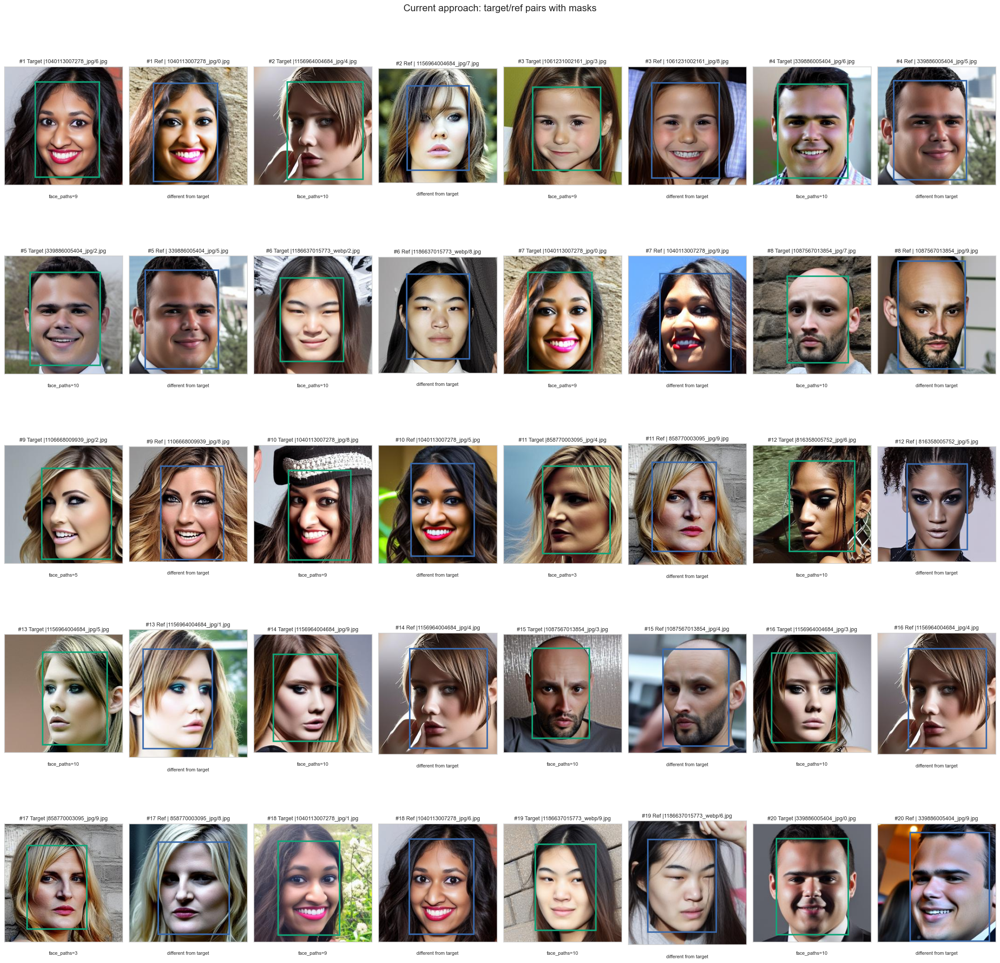

In [13]:
show_pair_grid(current_df, 'Current approach: target/ref pairs with masks')

## Shared `get_ref_images()` / `get_bigger_crop()` Approach

This mirrors the shared snippet literally where it matters for reference prep:
- target path stays the same as above for comparability
- reference path is sampled from **all** `face_paths`, so it can equal the target path
- reference crop uses the shared `get_bigger_crop()` logic

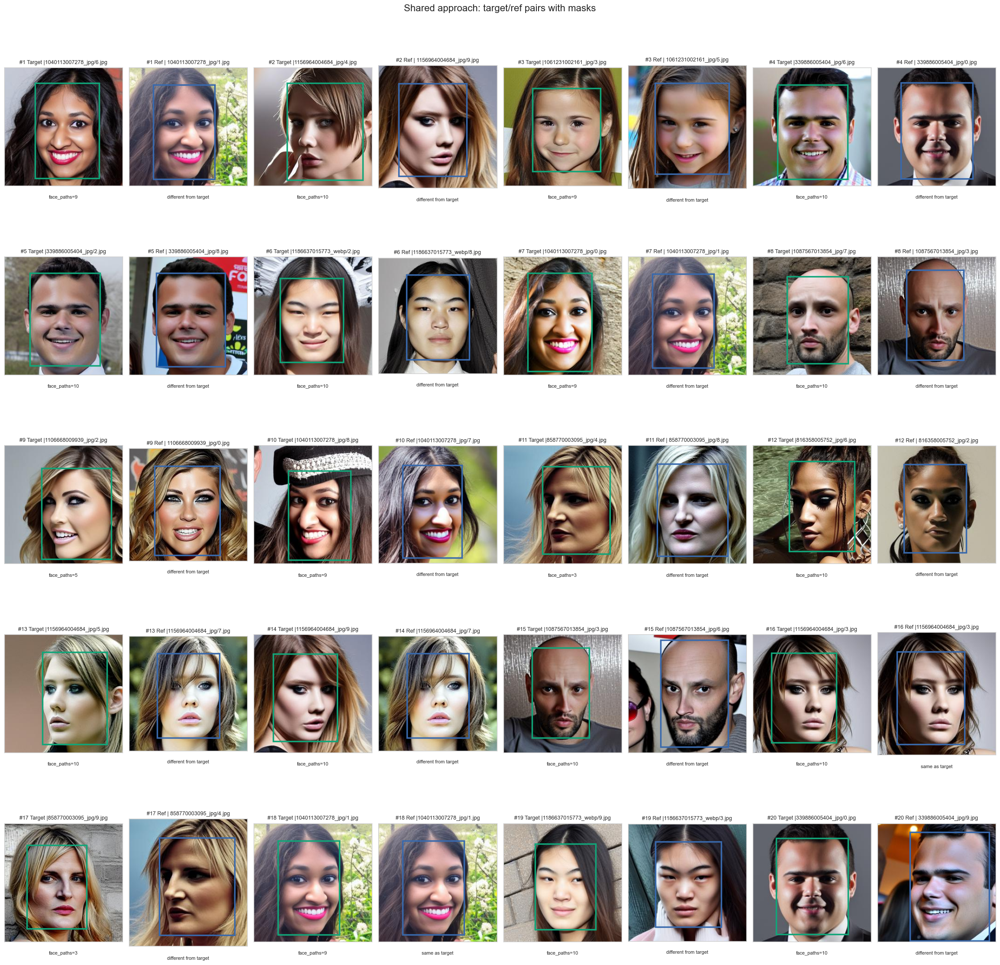

In [14]:
show_pair_grid(shared_df, 'Shared approach: target/ref pairs with masks')

## Quick Comparison Metrics

In [15]:
summary_df = pd.DataFrame([
    {
        'approach': 'current',
        'pairs': len(current_df),
        'ref_same_as_target': int(current_df['ref_same_as_target'].sum()),
        'avg_ref_crop_width': float(np.mean([img.size[0] for img in current_df['ref_img']])),
        'avg_ref_crop_height': float(np.mean([img.size[1] for img in current_df['ref_img']])),
    },
    {
        'approach': 'shared',
        'pairs': len(shared_df),
        'ref_same_as_target': int(shared_df['ref_same_as_target'].sum()),
        'avg_ref_crop_width': float(np.mean([img.size[0] for img in shared_df['ref_img']])),
        'avg_ref_crop_height': float(np.mean([img.size[1] for img in shared_df['ref_img']])),
    },
])
summary_df

,approach,pairs,ref_same_as_target,avg_ref_crop_width,avg_ref_crop_height
0,current,20,0,251.55,252.7
1,shared,20,2,251.05,251.4
